[View in Colaboratory](https://colab.research.google.com/github/tobiolabode/PinappleClassifer/blob/master/Pinapple_Classifer_eager.ipynb)

In [0]:
from __future__ import print_function, division, absolute_import
import tensorflow as tf
import tensorflow.contrib.eager as tfe
import os
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [3]:
tf.enable_eager_execution()
print("Eager execution: {}".format(tf.executing_eagerly()))

Eager execution: True


In [4]:
from google.colab import files
files.upload()

Saving Pineapple.zip to Pineapple.zip


{u'Pineapple.zip': 'PK\x03\x04\n\x00\x00\x00\x00\x00\x02\x96\x19M\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00Pineapple/PK\x03\x04\n\x00\x00\x00\x00\x00\x02\x96\x19M\xab\x90\xc7\r\xb9\x19\x00\x00\xb9\x19\x00\x00\x13\x00\x00\x00Pineapple/0_100.jpg\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x02\x01\x01\x01\x01\x01\x02\x01\x01\x01\x02\x02\x02\x02\x02\x04\x03\x02\x02\x02\x02\x05\x04\x04\x03\x04\x06\x05\x06\x06\x06\x05\x06\x06\x06\x07\t\x08\x06\x07\t\x07\x06\x06\x08\x0b\x08\t\n\n\n\n\n\x06\x08\x0b\x0c\x0b\n\x0c\t\n\n\n\xff\xdb\x00C\x01\x02\x02\x02\x02\x02\x02\x05\x03\x03\x05\n\x07\x06\x07\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\xff\xc0\x00\x11\x08\x00d\x00d\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05

In [5]:
from google.colab import files
files.upload()

Saving Pineapple_test.zip to Pineapple_test.zip


{u'Pineapple_test.zip': 'PK\x03\x04\n\x00\x00\x00\x00\x00<\x9d\x19M\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00Pineapple/PK\x03\x04\n\x00\x00\x00\x00\x00<\x9d\x19MW\x1e#\xf6\x8e\x19\x00\x00\x8e\x19\x00\x00\x14\x00\x00\x00Pineapple/12_100.jpg\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x02\x01\x01\x01\x01\x01\x02\x01\x01\x01\x02\x02\x02\x02\x02\x04\x03\x02\x02\x02\x02\x05\x04\x04\x03\x04\x06\x05\x06\x06\x06\x05\x06\x06\x06\x07\t\x08\x06\x07\t\x07\x06\x06\x08\x0b\x08\t\n\n\n\n\n\x06\x08\x0b\x0c\x0b\n\x0c\t\n\n\n\xff\xdb\x00C\x01\x02\x02\x02\x02\x02\x02\x05\x03\x03\x05\n\x07\x06\x07\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\xff\xc0\x00\x11\x08\x00d\x00d\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05

In [0]:
!mkdir pineapple

In [8]:
!mkdir pineapple/training

mkdir: cannot create directory ‘pineapple/training’: File exists


In [0]:
!mkdir pineapple/test

In [10]:
!unzip Pineapple_test.zip -d pineapple/test

Archive:  Pineapple_test.zip
   creating: pineapple/test/Pineapple/
 extracting: pineapple/test/Pineapple/12_100.jpg  
 extracting: pineapple/test/Pineapple/13_100.jpg  
 extracting: pineapple/test/Pineapple/143_100.jpg  
 extracting: pineapple/test/Pineapple/144_100.jpg  
 extracting: pineapple/test/Pineapple/15_100.jpg  
 extracting: pineapple/test/Pineapple/16_100.jpg  
 extracting: pineapple/test/Pineapple/173_100.jpg  
 extracting: pineapple/test/Pineapple/177_100.jpg  
 extracting: pineapple/test/Pineapple/17_100.jpg  
 extracting: pineapple/test/Pineapple/189_100.jpg  
 extracting: pineapple/test/Pineapple/18_100.jpg  
 extracting: pineapple/test/Pineapple/190_100.jpg  
 extracting: pineapple/test/Pineapple/192_100.jpg  
 extracting: pineapple/test/Pineapple/191_100.jpg  
 extracting: pineapple/test/Pineapple/193_100.jpg  
 extracting: pineapple/test/Pineapple/194_100.jpg  
 extracting: pineapple/test/Pineapple/195_100.jpg  
 extracting: pineapple/test/Pineapple/196_100.jpg  
 e

In [13]:
!unzip Pineapple.zip -d pineapple/training

Archive:  Pineapple.zip
   creating: pineapple/training/Pineapple/
 extracting: pineapple/training/Pineapple/0_100.jpg  
 extracting: pineapple/training/Pineapple/100_100.jpg  
 extracting: pineapple/training/Pineapple/101_100.jpg  
 extracting: pineapple/training/Pineapple/102_100.jpg  
 extracting: pineapple/training/Pineapple/103_100.jpg  
 extracting: pineapple/training/Pineapple/104_100.jpg  
 extracting: pineapple/training/Pineapple/105_100.jpg  
 extracting: pineapple/training/Pineapple/106_100.jpg  
 extracting: pineapple/training/Pineapple/108_100.jpg  
 extracting: pineapple/training/Pineapple/107_100.jpg  
 extracting: pineapple/training/Pineapple/109_100.jpg  
 extracting: pineapple/training/Pineapple/10_100.jpg  
 extracting: pineapple/training/Pineapple/110_100.jpg  
 extracting: pineapple/training/Pineapple/111_100.jpg  
 extracting: pineapple/training/Pineapple/112_100.jpg  
 extracting: pineapple/training/Pineapple/113_100.jpg  
 extracting: pineapple/training/Pineappl

In [0]:
PATH = "pineapple/"

In [15]:
files = os.listdir("pineapple/training/Pineapple")[:5]
files

['130_100.jpg', 'r_272_100.jpg', 'r_181_100.jpg', 'r_63_100.jpg', '11_100.jpg']

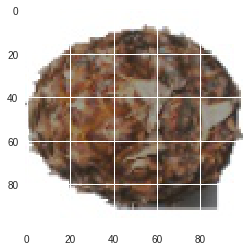

In [16]:
img = plt.imread("pineapple/training/Pineapple/r_2_100.jpg")
plt.imshow(img)

In [25]:
img[:4]

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)

In [17]:
filename_train = os.listdir("pineapple/training/Pineapple/")
filename_train[:10]

['130_100.jpg',
 'r_272_100.jpg',
 'r_181_100.jpg',
 'r_63_100.jpg',
 '11_100.jpg',
 'r_253_100.jpg',
 'r_259_100.jpg',
 'r_35_100.jpg',
 '105_100.jpg',
 '251_100.jpg']

In [68]:
filename_test = os.listdir("pineapple/test/Pineapple/")
filename_test[:10]

['226_100.jpg',
 'r_130_100.jpg',
 '270_100.jpg',
 'r_203_100.jpg',
 'r_225_100.jpg',
 '194_100.jpg',
 '177_100.jpg',
 'r_201_100.jpg',
 'r_222_100.jpg',
 'r_87_100.jpg']

In [70]:
i = iter(filename_test)

filename_test2 = [os.path.join("pineapple/test/Pineapple/", next(i)) for fname in filename_test if os.path.isfile ]



filename_test2[:5]

['pineapple/test/Pineapple/226_100.jpg',
 'pineapple/test/Pineapple/r_130_100.jpg',
 'pineapple/test/Pineapple/270_100.jpg',
 'pineapple/test/Pineapple/r_203_100.jpg',
 'pineapple/test/Pineapple/r_225_100.jpg']

In [80]:
x = iter(filename_train)

filename_train2 = [os.path.join("pineapple/training/Pineapple/", next(x)) for fname in filename_train if os.path.isfile ]



filename_train2[:5]

['pineapple/training/Pineapple/130_100.jpg',
 'pineapple/training/Pineapple/r_272_100.jpg',
 'pineapple/training/Pineapple/r_181_100.jpg',
 'pineapple/training/Pineapple/r_63_100.jpg',
 'pineapple/training/Pineapple/11_100.jpg']

In [85]:
xl = iter(filename_train2)
filename_train_read = [plt.imread(next(xl)) for fname in filename_train2]

filename_train_read[:5 :5]
#plt.imshow(filename_test_read[5])

[array([[[254, 255, 255],
         [254, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[254, 255, 255],
         [254, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        ...,
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
  

In [78]:
a = iter(filename_test2)
filename_test_read = [plt.imread(next(a)) for fname in filename_test2]

filename_test_read[:5]
#plt.imshow(filename_test_read[5])

[array([[[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        ...,
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
  

In [92]:
len(filename_train2)


490

In [93]:

len(filename_test2)

166

In [109]:
testlabel = np.ones(18750)
testlabel[:10]

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [105]:
trainlabel = np.ones(18750)
trainlabel[:10]

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [0]:
x_train = np.array(filename_train_read,dtype=np.float32) / 255
x_test = np.array(filename_test_read,dtype=np.float32) / 255
x_train = x_train.reshape((-1, 28, 28, 1))
x_test = x_test.reshape((-1, 28, 28, 1))

In [0]:
y_test = testlabel
y_train = trainlabel

In [107]:
print('x train', x_train.shape)
print('y train', y_train.shape)
print('x test', x_test.shape)
print('y test', y_test.shape)

x train (18750, 28, 28, 1)
y train (18750,)
x test (18750, 28, 28, 1)
y test (166,)


In [0]:
batch_size = 128
epochs = 8
num_classes = 1

In [0]:
# model definition (canonical way)
class CNN(tf.keras.Model):

    def __init__(self, num_classes):
        super(CNN, self).__init__()

        self.cnn1 = tf.keras.layers.Conv2D(16, (5, 5), padding='same', strides=(2, 2),
                                           kernel_initializer='he_normal')
        self.bn1 = tf.keras.layers.BatchNormalization()
        self.cnn2 = tf.keras.layers.Conv2D(32, (5, 5), padding='same', strides=(2, 2),
                                           kernel_initializer='he_normal')
        self.bn2 = tf.keras.layers.BatchNormalization()
        self.pool = tf.keras.layers.GlobalAveragePooling2D()
        self.classifier = tf.keras.layers.Dense(num_classes)

    def call(self, inputs, training=None, mask=None):
        x = self.cnn1(inputs)
        x = self.bn1(x)
        x = tf.nn.relu(x)  # layer 1
        x = tf.nn.relu(self.bn2(self.cnn2(x)))  # layer 2
        x = self.pool(x)
        output = self.classifier(x)

        # softmax op does not exist on the gpu, so always use cpu
        with tf.device('/cpu:0'):
            output = tf.nn.softmax(output)

        return output

In [112]:
device = '/cpu:0' if tfe.num_gpus() == 0 else '/gpu:0'

with tf.device(device):
    # build model and optimizer
    model = CNN(num_classes)
    model.compile(optimizer=tf.train.AdamOptimizer(0.001), loss='categorical_crossentropy',
                  metrics=['accuracy'])

    # train
    model.fit(x_train, y_train, batch_size=batch_size, epochs=epochs,
              validation_data=(x_test, y_test), verbose=1)

    # evaluate on test set
    scores = model.evaluate(x_test, y_test, batch_size, verbose=1)
    print("Final test loss and accuracy :", scores)

Train on 18750 samples, validate on 18750 samples
Epoch 1/8
18750/18750 [==============================] - 3s 171us/step - loss: 1.1921e-07 - acc: 1.0000 - val_loss: 1.1921e-07 - val_acc: 1.0000
Epoch 2/8
18750/18750 [==============================] - 3s 170us/step - loss: 1.1921e-07 - acc: 1.0000 - val_loss: 1.1921e-07 - val_acc: 1.0000
Epoch 3/8
18750/18750 [==============================] - 3s 170us/step - loss: 1.1921e-07 - acc: 1.0000 - val_loss: 1.1921e-07 - val_acc: 1.0000
Epoch 4/8
18750/18750 [==============================] - 3s 174us/step - loss: 1.1921e-07 - acc: 1.0000 - val_loss: 1.1921e-07 - val_acc: 1.0000
Epoch 5/8
18750/18750 [==============================] - 3s 171us/step - loss: 1.1921e-07 - acc: 1.0000 - val_loss: 1.1921e-07 - val_acc: 1.0000
Epoch 6/8
18750/18750 [==============================] - 3s 176us/step - loss: 1.1921e-07 - acc: 1.0000 - val_loss: 1.1921e-07 - val_acc: 1.0000
Epoch 7/8
18750/18750 [==============================] - 3s 175us/step - loss: 1